<style>
  h1 {
    color: Navy !important;
  }
  h2 {
    color: Seagreen !important;
  }
  h3 {
    color: Maroon !important;
  }
</style>

# Data-driven approaches to understanding dementia
## Application of single cell analysis to dementia research: practical
### Mark Fiers & Emma Davis

## Goals

* Understand a single cell data analysis workflow
* Practically run a basic single cell workflow
* Understand where things can go wrong (and how to catch problems)
* Pointers on where to continue your analysis

## Outline 

- Introduction
- Finding & loading data
- Preprocessing & QA
- Dimensionality reduction & clustering
- Differential expression, finding marker genes
- Continuing the analysis
- Closing remarks

## Trust, But verify.

*- or - a reflection on data analysis & bioinformatics*

* Treat all operations as 'black box'.
* Understand and check input & output.
* Once you have a result, confirm using raw data. For example, you have gene X upregulated in elder microglia - go back to the raw counts, and independently check it is the case.
* Understand the biology & published literature - be wary of results that contradict what you expect.


## Experimental setup

How your experiment was performed, and how it compares to your expectations and/or literature depends on how the experiment was performed.

| | | | |
|-|-|-|-|
| **General**     | [Power analysis ](https://www.nature.com/articles/s41467-021-26779-7)  | Randomization | Controls |
| **Samples**     | Selection           | Matched samples   | Post mortem delay     | 
| **Preparation** | Cells or nuclei     | FACS Sorted? | Library prep protocol |
| **Sequencing**  | Sequencing platform | Depth        | |


## Importance of experimental setup

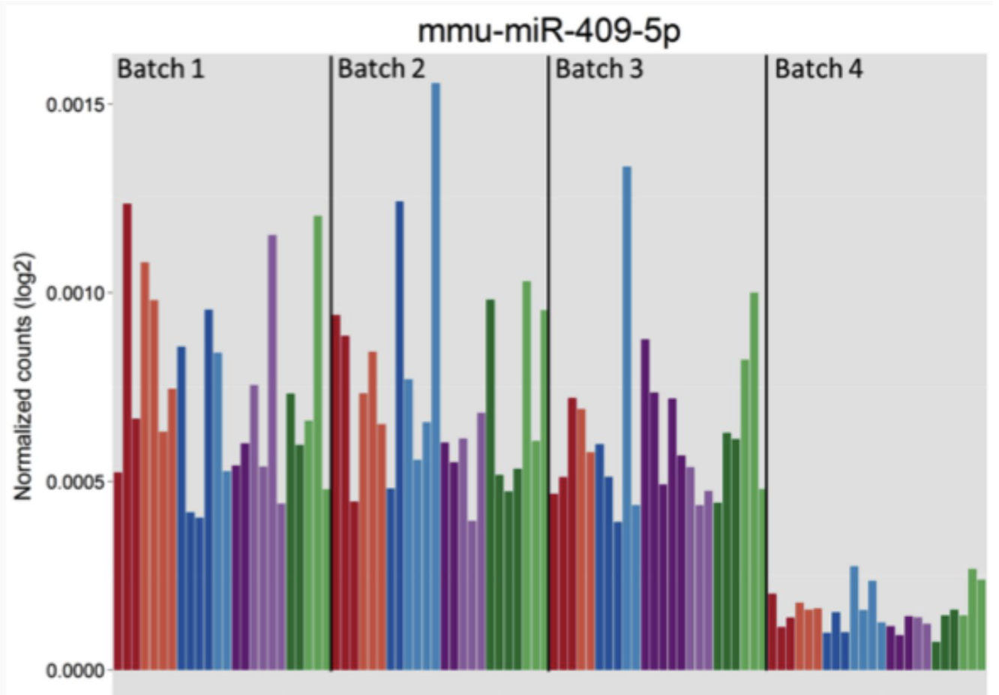

## How to get help?

- Tutorials (eg, [Scanpy tutorials](https://scanpy-tutorials.readthedocs.io/en/latest/))
- Your friendly neighbourhood bioinformatician
- chatGPT & friends
- Google
- Read API documentation (describing the functions in a package (eg, [Scanpy API](https://scanpy.readthedocs.io/en/latest/api/index.html))
- Fiddle around

---

# Technicalities

## Conda / Mamba

We are running in a conda environment. Conda is a software package manager - allows you to maintain a consistent and reproducible software environment. Mamba is it's interchangeable, but faster sister. [Read more on the Mamba documentation page](https://mamba.readthedocs.io/)

### Recreate this conda/mamba environment

```
# or mamba install
conda install -c conda-forge scanpy python-igraph leidenalg \
    jupyterlab seaborn scikit-learn statsmodels colorcet \
    scipy matplotlib jupyterlab jupyter_contrib_nbextensions \
    pooch scikit-image
```

## Jupyter

Jupyter is a digital notebook to organize code, documentation and visualizations. Jupyter allows you to:

- Organize a data analysis workflow
- Share your workflow (the `.ipynb` notebook) with others
- Document your code and results in one document (literate programming)
- Repeat an analysis

## Start our session

### First - go to your VM and open a terminal:

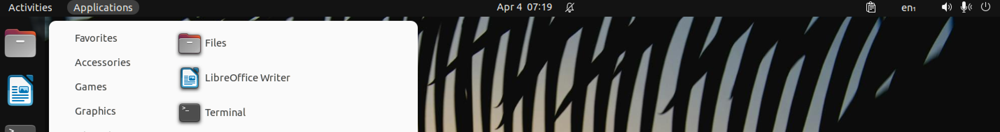

### Startup the environment

```
cd MF_SingleCell                 # Go to our work folder
./download_notebook.sh           # Download the ipython notebook
conda activate MF_SingleCell     # Start the conda environment
jupyter lab                      # Start jupyter lab
```

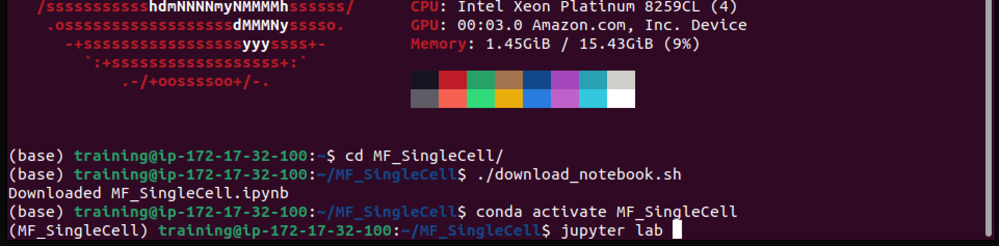

### Jupyter lab initial interface

*Maybe you need to click the `MF_SingleCell.ipynb` link on the left*

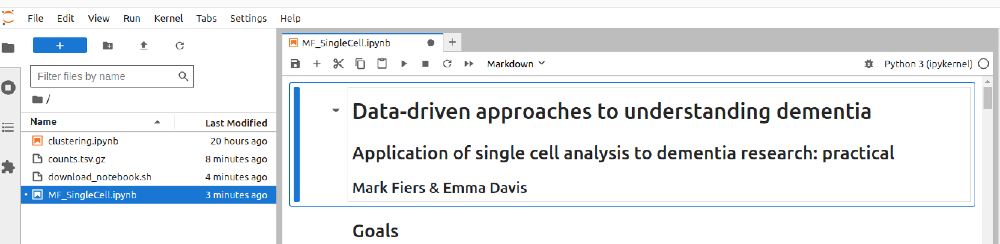

## Import modules

We'll need to tell python what libraries we are going to use

## <span style="color:crimson">Exercise:</span> Execute this cell.

In [1]:
import scanpy as sc              # Single cell analysis toolkit
import pandas as pd              # Sort of Excel on steroids (in Python)
import matplotlib.pyplot as plt  # Plotting library
import seaborn as sns            # Pretty plots

---

# Scanpy

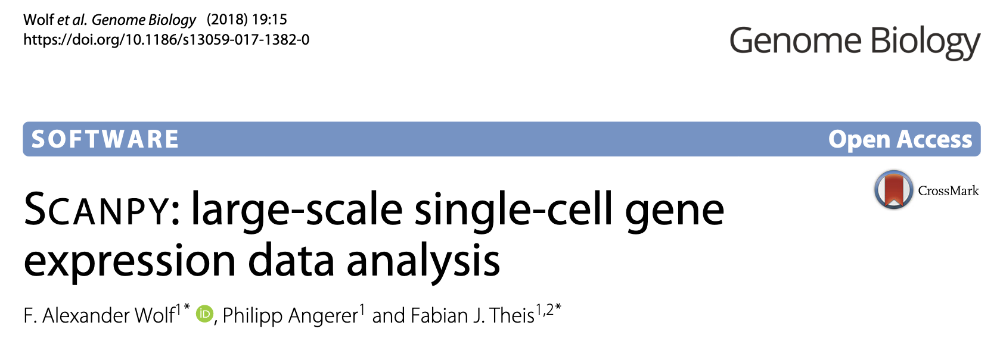

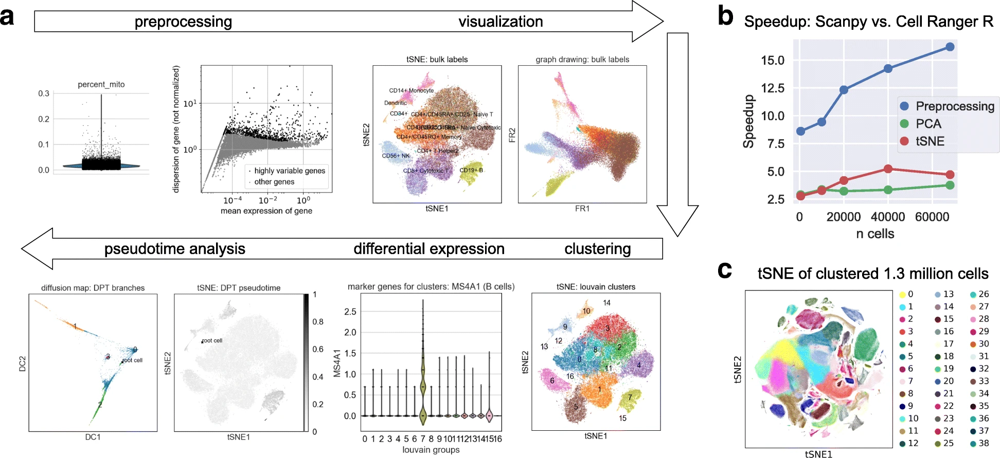

### A Simple Workflow

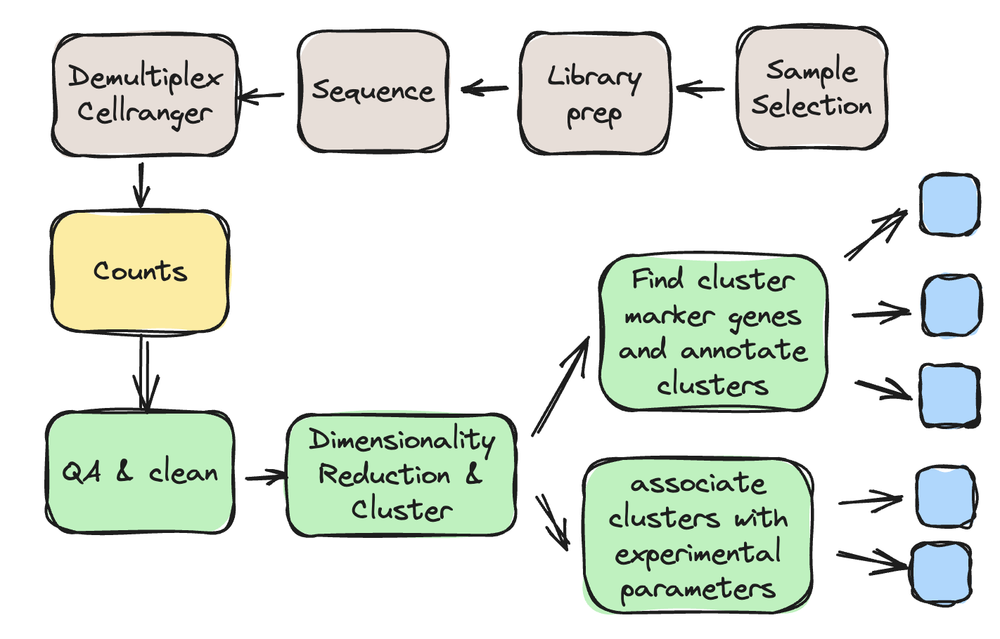

## Scanpy vs R/Seurat?

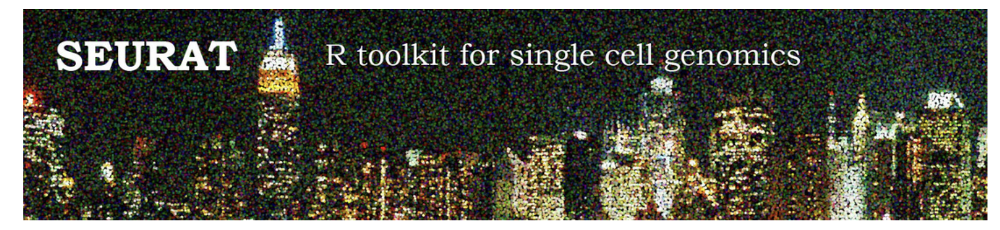

* Both very capable frameworks
* Python vs R & their ecosystems
* R/Seurat is better for advanced statistics, specifically **differential expression** analysis.

---

# Data-set
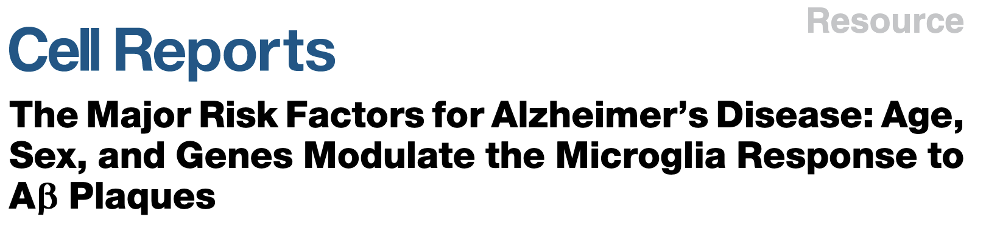


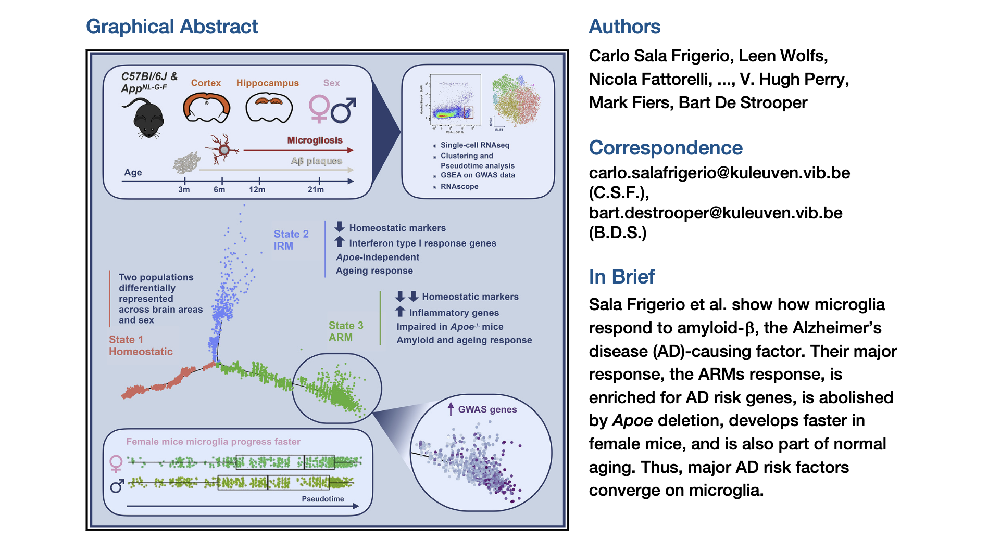

---

# Getting the raw data

First step is to get your hands on the raw data!

## Cellranger

CellRanger is a 10x Genomics software tool used to process single-cell RNA-seq data. CellRanger aligns reads to a reference genome and creates feature-barcode (gene-cell) matrices to allow exploration of gene expression at a single-cell level.

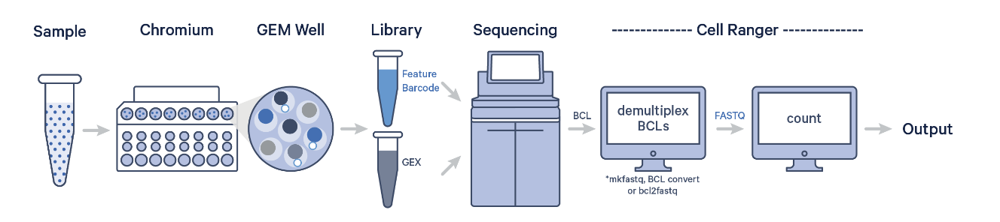

To download and get started using CellRanger, 10x have provided everything you may need [here](https://www.10xgenomics.com/support/software/cell-ranger/latest).


## From a count matrix.

Often, authors will provide a count matrix & metadata. This is much easier, as you do not need to map all reads again. 

For today we have such a **raw count** matrix & **cell metadata** table called: `counts.tsv.gz` and `metadata.tsv.gz`. 

There are gzipped (compressed) tab-separated text files.

In [2]:
# trick in a jupyter notebook - any line starting with a ! executes as a bash/shell command
!ls -lh counts.tsv.gz metadata.tsv.gz

-rw-r--r--@ 1 u0089478  1547395761    61M Apr  3 13:47 counts.tsv.gz
-rw-r--r--@ 1 u0089478  1547395761    33K Apr  3 20:51 metadata.tsv.gz


## Metadata.

The experiment compares microglia from mice multiple ages (3, 6, 12 and 21 months); from male and female mice; from hippocampus and cortex; and from wild-type mice and APP-NLGF AD model mice. The metadata fields are encoded as:

| Field          |                  |                    |
|:---------------|:-----------------|:-------------------|
| **sex (gender)**     | **F**: Female    | **M**: Male        |
| **genotype**  | **K**: APP-NLGF  | **W**: Wild type   |
| **tissue**     | **C**: Cortex    | **H**: Hippocampus |
| **plate**      | Plate the cell was captured in        ||
| **lane**       | Sequencing run                       ||

## Load the data

In [3]:
# load raw counts using pandas' `read_csv` function
# This may take a little while.
counts = pd.read_csv('counts.tsv.gz', sep="\t", index_col=0)
counts.shape    # determine how big the table is - 10801 cells x 29474 genes

(10801, 29474)

In [4]:
# load metadata
metadata = pd.read_csv('metadata.tsv.gz', sep="\t", index_col=0)
# rename gender to sex
metadata = metadata.rename(columns=dict(gender='sex'))
metadata.shape   # metadata, 10801 cells again - same as the count table and 6 columns

(10801, 6)

## Inspect your data!

### Count table

Very important - never blindly rely on data being what you think it is.

Note, cells are in rows, genes as columns. This is how Scanpy needs it later on.

In [5]:
counts.iloc[:5,:5]

,-343C11.2,00R_AC107638.2,0610005C13Rik,0610006L08Rik,0610007P14Rik
K03FC.1A10,0,0,0,0,0
K03FC.3A6,0,0,0,0,0
K03FH.3B1,0,0,0,0,0
K03FH.3E3,0,0,0,0,0
K03FH.4A11,0,0,0,0,0


This is an awful lot of zero's. A cell can be zero if a gene does not express in that cell - or - if for whatever reason the gene is not picked up. Single cell transcriptomics, compared to bulk transcriptomics has to work with very little RNA - and hence - it's sensitivity is much lower. In this dataset ~93% is zero, which is not abnormal and explains the large number of zero's in the snippet above (in bulk RNAseq I would expect that to be well below 50%)

Let's find some gene x cells that do show expression. First, which genes express highly overall?

In [6]:
# note the power of pandas by chaining operations:
# first we sum per gene, 
#    then sort descendingly, 
#    and show the 'head'
counts.sum().sort_values(ascending=False).head()

Rn18s-rs5    269069792
Cst3         257752441
Hexb          92712398
Ctss          82061674
Cx3cr1        77511440
dtype: int64

Then we can check the values of a few genes across all cells - we have a much better chance to see genes express now.

It usually pays off to have a few *favourite* genes to follow throughout your analysis. Helps to keep a global view. I'm adding "Apoe".

In [7]:
counts[ ['Cst3', 'Hexb', 'Ctss', 'Apoe'] ].head()

,Cst3,Hexb,Ctss,Apoe
K03FC.1A10,6630,2134,3327,1
K03FC.3A6,7155,74,1131,0
K03FH.3B1,4601,2459,2507,0
K03FH.3E3,853,589,552,0
K03FH.4A11,3944,1426,1701,0


Note, these are all integers - as you would expect dealing with raw counts! 

### Density plots to check individual gene expression

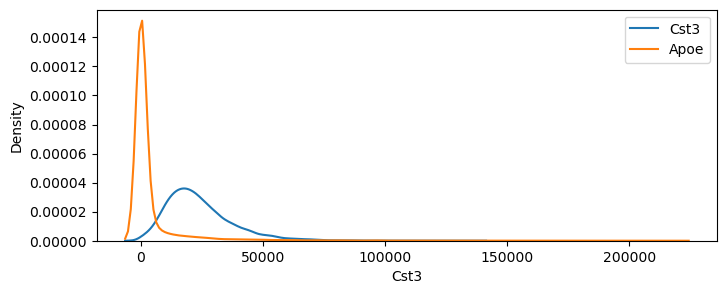

In [9]:
plt.figure(figsize=(8,3))
sns.kdeplot(counts['Cst3'], label='Cst3')
sns.kdeplot(counts['Apoe'], label='Apoe')
plt.legend();

### <span style="color:crimson"> Exercise:</span> Create a scatterplot of the expression of Cst3 vs Apoe.

If you don't know how to do this, try google or chatGPT.

## Same for metadata

In [10]:
metadata.head()

,age,sex,genotype,tissue,plate,lane
K03FC.1A10,3,F,K,C,1,mglia25
K03FC.3A6,3,F,K,C,3,mglia26
K03FH.3B1,3,F,K,H,3,mglia28
K03FH.3E3,3,F,K,H,3,mglia28
K03FH.4A11,3,F,K,H,4,mglia28


###  How many cells per experimental group?

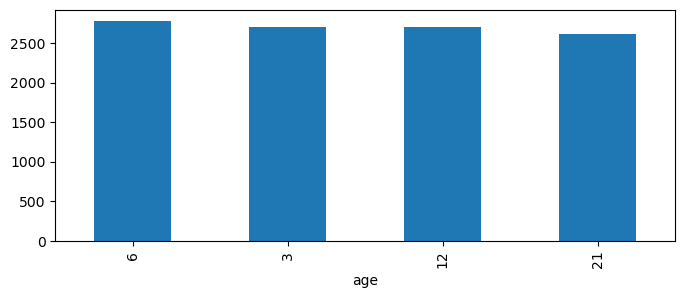

In [11]:
# Many roads lead to Rome - there are a number of ways in which this plot could have been made..
plt.figure(figsize=(8,3))
metadata['age'].value_counts().plot.bar();

## Pivot tables

Another important check is to see if your cells are balanced across experimental conditions. It may make certain comparisons difficult otherwise.

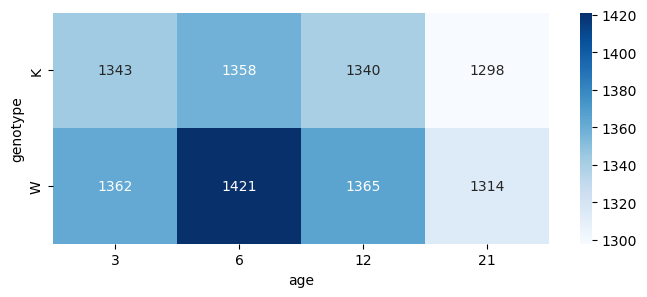

In [12]:
# More advanced, most of the magic is in pandas.
plt.figure(figsize=(8,3))
pivot = metadata.pivot_table(columns='age', index='genotype', 
                             values='plate', aggfunc=len)
sns.heatmap(pivot, annot=True, cmap='Blues', fmt='d');

### <span style="color:crimson">Exercise:</span> Create barplots showing the number of cells for each category in genotype and sex.

---

# Preprocessing & QC

Time to move to Scanpy. We are in broad strokes following [this tutorial](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html). For a number of steps, I verbatim copy bits from this tutorial (those will be marked by a "[<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html)" link to the relevant section.

## Create a scanpy object
First we create a scanpy object.

In [10]:
adata = sc.AnnData(counts, obs=metadata)

# last line in a cell gets printed. 
# Printing adata shows what it knows:
#    10801 cells (obs), 
#    ~29k genes (vars) 
#    and a number of metadata fields per cell (obs).
adata     

AnnData object with n_obs × n_vars = 10801 × 29474
    obs: 'age', 'sex', 'genotype', 'tissue', 'plate', 'lane'

## AnnData structure

Main attributes are:
- `adata.X` is a matrix with the counts
- `adata.obs` contains the per cell metadata.
- `adata.var` contains per gene metadata

In [11]:
# adata.X is a `numpy array`
adata.X[:3,:10]

array([[ 0,  0,  0,  0,  0,  0,  0,  0, 13,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0]])

In [12]:
#adata obs is a regular pandas object - we see our metadata again
adata.obs.head(3)

,age,sex,genotype,tissue,plate,lane
K03FC.1A10,3,F,K,C,1,mglia25
K03FC.3A6,3,F,K,C,3,mglia26
K03FH.3B1,3,F,K,H,3,mglia28


## Calculate QC stats in Scanpy

Scanpy provides a nice utility function that gathers a number of quality related statistics [<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#quality-control). Such as:

* No of reads and unique genes per cell
* No of mitochondrial & ribosomal reads per cell

In [15]:
# converting the var names (gene names) to upper string - to make sure 
# this works with both mouse and human
adata.var["mt"] = \
    adata.var_names.str.upper().str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = \
    adata.var_names.str.upper().str.startswith(("RPS", "RPL"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo"], inplace=True, log1p=True )

## Scanpy QC plots

We can now inspect violin plots to see the distribution of a number of quality parameters. These plots are important to understand the quality of the data, and you can use them for an initial filtering step. However, be careful in filtering too quickly.

From the [<span style="color:green">[Scanpy tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#quality-control): 

> Based on the QC metric plots, one could now remove cells that have too many mitochondrial genes expressed or too many total counts by setting manual or automatic thresholds. However, sometimes what appears to be poor QC metrics can be driven by real biology so we suggest starting with a very permissive filtering strategy and revisiting it at a later point. We therefore now only filter cells with less than 100 genes expressed and genes that are detected in less than 3 cells.


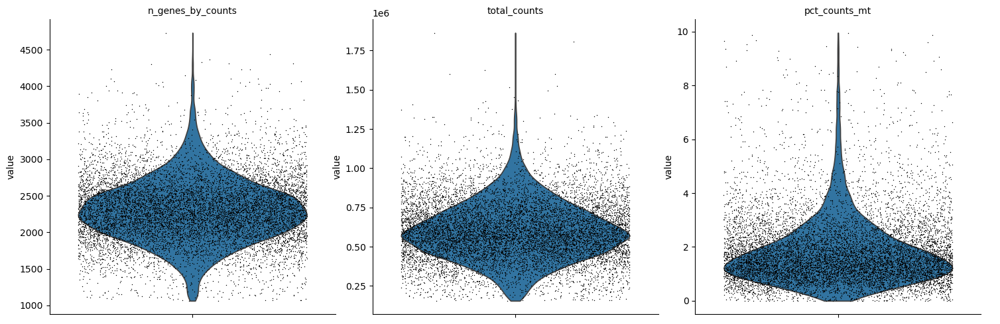

In [16]:
sc.pl.violin(
    adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4, multi_panel=True)

## Filter

We start out with a very lenient filter, and use these quality statistics later to see how they affect clusters.

Note: these data come from an already published dataset, the filtering was already performed, and these steps do not make any difference.

In [17]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

## Doublets

One common occurence is that one droplet captures more than one cell. Scanpy embeds the [scrublet](https://github.com/swolock/scrublet) algorithm that predicts based on simulated doublets [<span style="color:green">(tutorial)</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#doublet-detection)

We run this by (note this may takes a while)

In [18]:
sc.pp.scrublet(adata)

Scrublet adds two extra columns to the `adata.obs` object:

In [19]:
adata.obs[['doublet_score', 'predicted_doublet']].head(3)

,doublet_score,predicted_doublet
K03FC.1A10,0.029006,False
K03FC.3A6,0.041211,False
K03FH.3B1,0.046968,False


We could filter on doublets here, but it is smarter to check clusters later.

## Integration

Experiments have batch effects. This can be due to many reasons, such as technical variation (differences in sample preparation, sequencing runs, or data sets have a different source). If this is the case you need to integrate. Below is an example of a dataset pre-integration and post integration ([src](https://www.biorxiv.org/content/10.1101/483297v1.full)).

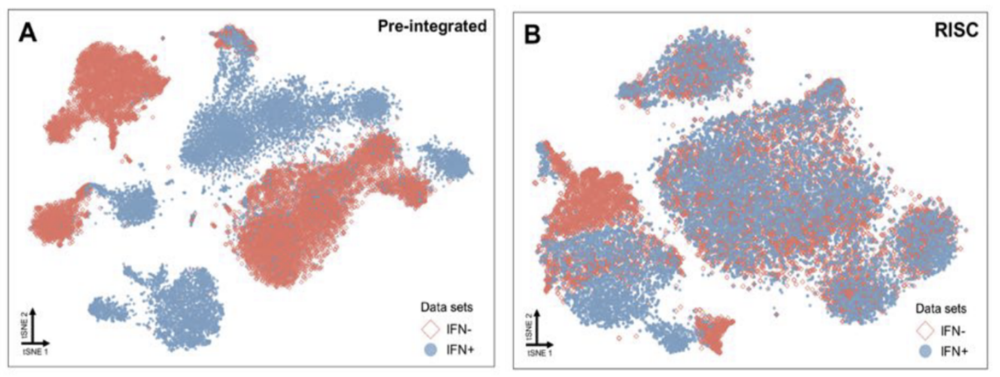

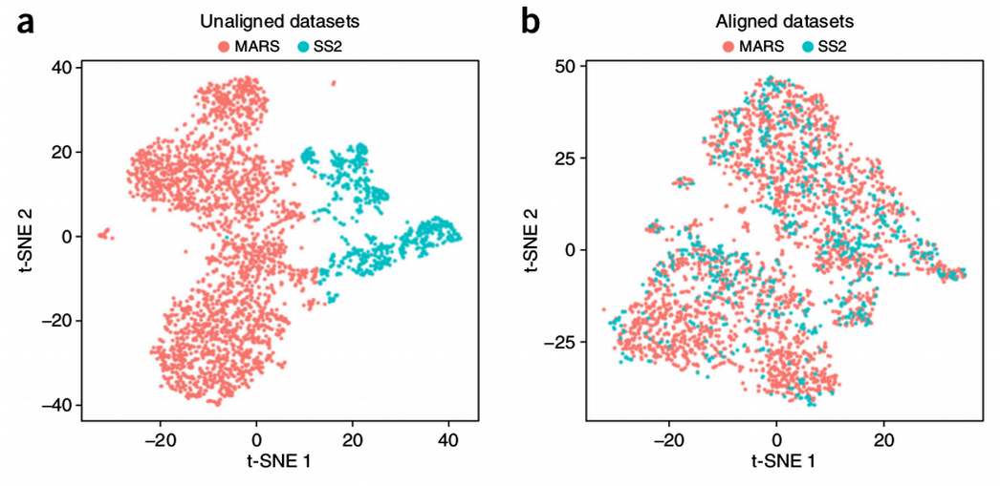

## Integration

**You must be sure the differences are not biological!**

Scanpy offers a range of methods for batch correction and data integration, such as mnn_correct, bbknn and scanorama_integrate to align datasets. Outside of Scanpy, you can also use scVI, scANVI or Harmony.


## Normalization

We are still dealing with raw counts. We typically would:

* Correct per cell **sequencing depth** to compare cells
* Go to **log space** so we do not only look at changes in highly expressing genes

[<span style="color:green">[From the tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#normalization): 

> The next preprocessing step is normalization. A common approach is count depth scaling with subsequent log plus one (log1p) transformation. Count depth scaling normalizes the data to a “size factor” such as the median count depth in the dataset, ten thousand (CP10k) or one million (CPM, counts per million). The size factor for count depth scaling can be controlled via target_sum in pp.normalize_total. We are applying median count depth normalization with log1p transformation (AKA log1PF).

In [20]:
# Saving a copy of the raw count data into 
# adata.layers
adata.layers["counts"] = adata.X.copy()
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

---

# Dimensionality reduction & clustering

Now we have a (relatively) massive dataset:

In [21]:
adata.shape

(10801, 29025)

The most common approach is clusters all cells on their expression profile, and then study clusters (instead of cells)

This is typically done by reducing the number of dimensions (bring down 10,801 cells to a much smaller number of clusters). 

This is called **[dimensionallity reduction](https://en.wikipedia.org/wiki/Dimensionality_reduction)**. The most well known version of this is Principal Component Analysis ([PCA](https://en.wikipedia.org/wiki/Principal_component_analysis))

[<span style="color:navy">[From Wikipedia]</span>](): 
> Dimensionality reduction, or dimension reduction, is the transformation of data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data, ideally close to its intrinsic dimension. Working in high-dimensional spaces can be undesirable for many reasons; raw data are often sparse as a consequence of the curse of dimensionality, and analyzing the data is usually computationally intractable (hard to control or deal with). Dimensionality reduction is common in fields that deal with large numbers of observations and/or large numbers of variables, such as signal processing, speech recognition, neuroinformatics, and bioinformatics.[1] 

## Feature selection

The first step is to select the most informative genes. Many genes will vary little within our experiment. 

To improve power, we will remove them for subsequent analysis [<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#feature-selection)

In [22]:
# This tags the highly variable genes.
sc.pp.highly_variable_genes(adata, n_top_genes=3000)

#and adds this to adata.var
adata.var.loc[['Cst3', 'Apoe', 'Hexb'], ['highly_variable','means','dispersions','dispersions_norm']]

,highly_variable,means,dispersions,dispersions_norm
Cst3,False,10.046235,8.396836,0.707107
Apoe,True,8.182927,10.429324,2.512982
Hexb,False,9.010912,6.830448,-1.103040


### We can plot the results

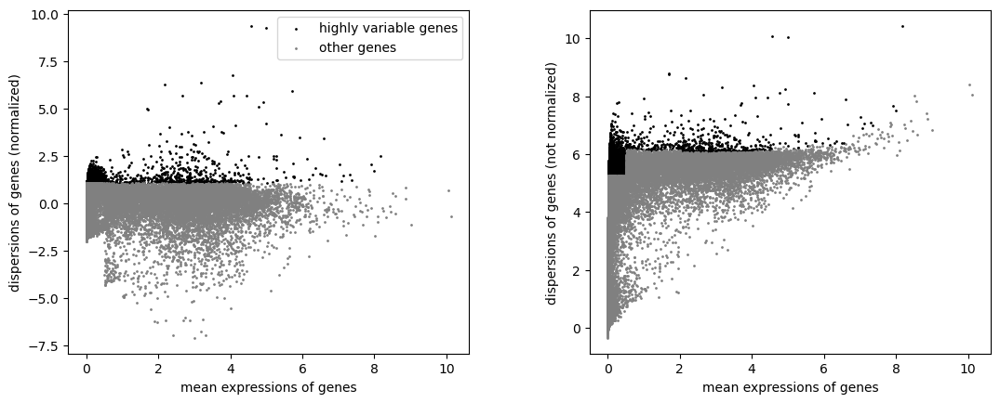

In [23]:
sc.pl.highly_variable_genes(adata)

## Principal Component Analysis

[<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#dimensionality-reduction) 

First step is to run PCA, which will predict the 50 most descriptive components

In [24]:
sc.tl.pca(adata)

### Plot PCA explained variance

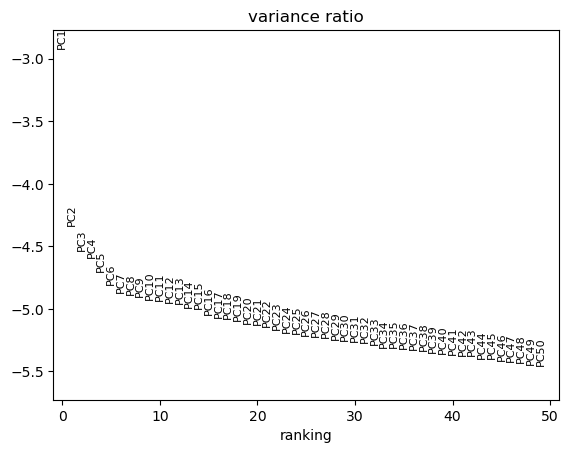

In [25]:
# and plot explained variance per component
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

You can see that there are few components that explain a lot of observed variance (up until 7). The rest steadily drops in explained variance - at a certain moment the algorithm only shows noise.

### PLot PCA

We can now see how cells with different experimental parameters distribute, when we look at the first 2 components.

<Figure size 500x250 with 0 Axes>

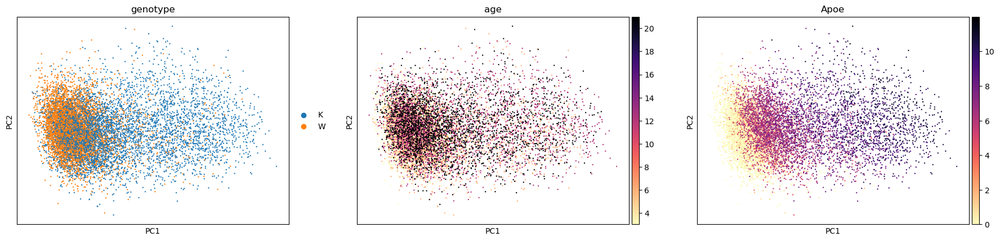

In [36]:
plt.figure(figsize=(5,2.5));
sc.pl.pca(adata, color=["genotype", "age", "Apoe"], cmap='magma_r');

Although we only see the first 2 components, and there is more variation to be discovered.  We do already see **separation on genotype**, and, as we expected, **Apoe is definitely up in the APP-NLGF mice**. 

### <span style="color:crimson">Exercise:</span> Recreate this plot for components 3 & 4 (or PC2 & PC3)

## Neighbours & UMAP

We have 7, maybe more, linear components that have possible relevant information on our microglia. We can only visualize 2 at a time ([challenge!](https://matplotlib.org/stable/gallery/mplot3d/rotate_axes3d_sgskip.html)). 

To further reduce dimensions we use a non-linear approach which consists of two steps. Calculating a **neighbour distance graph**, followed by **UMAP** (historically also TSNE) [<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#nearest-neighbor-graph-constuction-and-visualization).

Note, a nice page to understand UMAP is: [understanding-umap](https://pair-code.github.io/understanding-umap/)

Running this may take some time.

In [28]:
# it is ok to experiment with parameters
sc.pp.neighbors(adata, n_pcs=7, random_state=9999)
sc.tl.umap(adata, random_state=9999)

/Users/u0089478/.pyenv/versions/mambaforge-23.11.0-0/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Note, both of these functions have parameters. It sometimes pays of to experiment with them. Read the Scanpy API documentation:
- https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.umap.html
- https://scanpy.readthedocs.io/en/stable/api/generated/scanpy.pp.neighbors.html

### Visualizing UMAP

A UMAP wraps up multiple dimensions into two, for easy visualization.

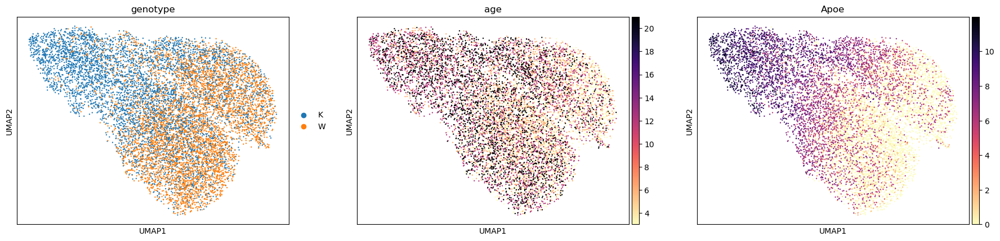

In [29]:
sc.pl.umap(adata, color=["genotype", "age", "Apoe"], cmap='magma_r')

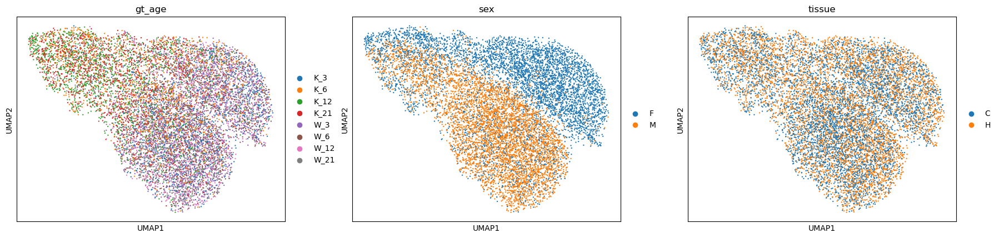

In [31]:
# making a categorical variable that combined genotype + age
adata.obs['gt_age'] = adata.obs['genotype'].astype(str) + '_' + adata.obs['age'].astype(str)
sc.pl.umap(adata, color=["gt_age", "sex", "tissue"], cmap='magma_r')

## Cluster

Last step is to calculate clusters using the Leiden algorithm [<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#clustering) 

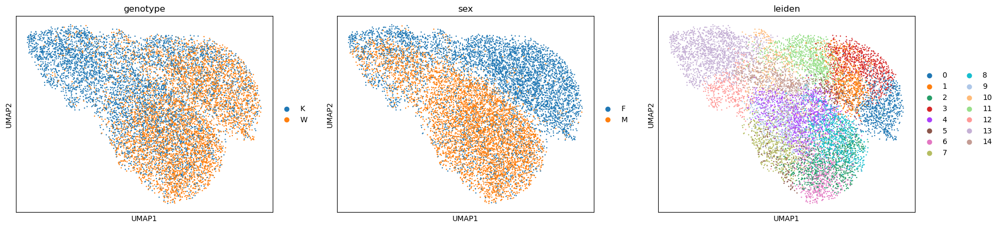

In [30]:
sc.tl.leiden(adata, flavor="igraph", n_iterations=2, resolution=1)
sc.pl.umap(adata, color=["genotype", "sex", "leiden"], cmap='magma_r')

## Interpretation of UMAP structure!

* A UMAP (and TSNE) aims to preserve local structure: cells that are close together are alike.

**However:**

* Larger distances have little meaning
* Be careful interpreting density - denser clusters do not have to be more alike.
* Cluster *tears* can occur.
* Continuities (clusters that blend) may suggest progress, growth or development. Or they may be low quality cells. In particular doublets will appear as a "continuity".

**All your conclusions COULD be the result of a problem with data or data analysis**

## Interpretation of UMAP structure!

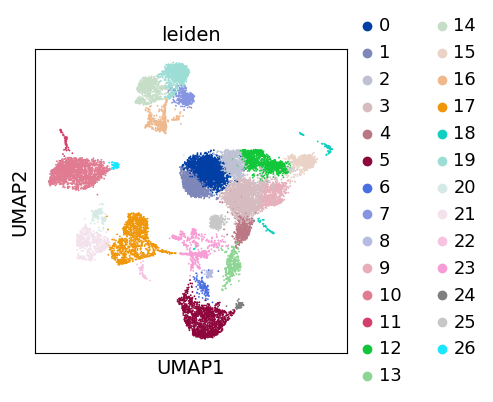

Image taken from the [scanpy website](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#clustering).

## How many clusters?

The number of clusters we got is high. Deciding on how many clusters you should have is non trivial, and can depend on multiple factors:

* Complexity of the dataset - a set with all brain cells (instead of just microglia) will have many more clusters.
* Your scientific question - do you really need to see all subclusters? You may not care about all microglia cellstates if you are 'just' after microgliosi.

**However:**

* `Resolution` is just a parameter
* Contaminations and low quality cells can also produce cluster. Quality and contaminations - we hardly filtered earlier on. This is a good moment to reasses if we need to filter more

### <span style="color:crimson">Exercise:</span> Visualisize Quality stats in the UMAP

Earlier on we generated a number of quality statistics. Visualisize these in the UMAP.

For example: `n_genes_by_counts`, `pct_counts_mt`, `doublet_score`

If you decide that there are contaminations (regions/clusters with a very bad quality score) - take a note, remove them from the `adata` object, and repeat everything including QC & PCA.

[<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#re-assess-quality-control-and-cell-filtering)

### <span style="color:crimson"> Exercise:</span> Experiment with the resolution parameter until you have five clusters.

**Warning:** This process is normally more iterative, cluster, interpret, decide you need more QA, or more or less clusters.

---

# Understand clusters

Given that we now have clusters - how do we interpret these? Some questions:

* Which genes are differential between clusters?
* What are the different clusters? (cell types&states)?
* How do they differ across conditions (age/genotype)



## Differential expression

Once we have done clustering we want to find genes that are differential in each cluster.

One command runs all clusters (each against all other clusters):

In [32]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')

Differential expression is the one area where `R` outshines python. Almost all advanced transcriptomics differential expression packages are written in R. 

Wilcoxon suffices for many cases however. Do note that it vastly exaggerates p-values.

**Note:** We're now doing DE on `leiden` clustering - we could have used `genotype` as well, or `age`.

## Visualizing cluster marker genes

Based on our DE, we have genes that are deregulated in each of the clusters. First, lets visualize them:

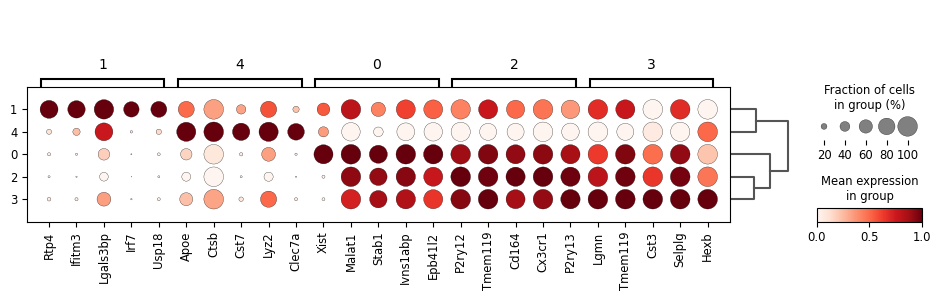

In [33]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden", standard_scale="var", n_genes=5 )

### <span style="color:crimson"> Exercise:</span>Change this plot to a matrixplot plot.

See [<span style="color:green">[here]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/plotting/core.html#visualize-marker-genes-using-matrixplot)

## Save to disk

We can save the marker genes to tsv files for further analysis (so you can open them in a spreadsheet program).

We're also keeping a dictionary (in `topgenes`) with the top 50 for each cluster for analysis later.

In [121]:
# Retrieve the marker genes data for 'leiden' clustering
result = adata.uns['rank_genes_groups']
clusters = result['names'].dtype.names
topgenes = {}

# Extract marker gene names for the current cluster from the 'leiden' analysis
for cluster in clusters:
    de_results = pd.DataFrame({
        'names': result['names'][cluster],
        'lfc': result['logfoldchanges'][cluster],
        'padj': result['pvals_adj'][cluster],
    })    
    #sort by LFC
    de_results = de_results.sort_values(by='lfc', ascending=False)
    topgenes[cluster] = list(de_results.head(50)['names'])
    # Save to a TSV file, one for each cluster
    de_results.to_csv(f'cluster_{cluster}.tsv', sep='\t', index=False)

## Save to disk

We can also save the full adata object, so that it is easy to restart or share your analysis

In [37]:
adata.write_h5ad('salafrigerio_analyzed.h5ad')

## Module scores

It is common to use sets of marker genes from other studies to understand yours. We will use this paper:

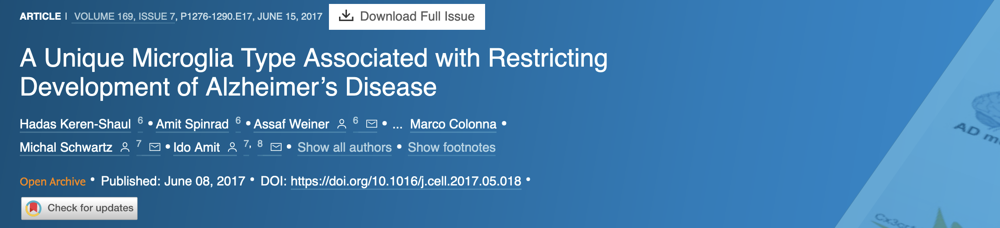


In [122]:
#from their supplemental information
DAMgenes = ['Itgax', 'Mamdc2', 'Cst7', 'Fam20c', 'Ccl4', 'Lmbrd2', 'Egr2', 
            'Csf1', '5430435G22Rik', 'Ccl3', 'Clec7a', 'Baiap2l2', 'Tmem154', 
            'Lpl', 'Ank', 'Zfp692', 'Siglec1', 'Itga5', 'Tcf19', 'Cox6a2', 
            'Spp1', 'Axl', 'Igf1', 'Gpnmb', 'Ildr2', 'Fxyd6', 'Psat1', 'Il1b', 
            'St14', 'Arhgap26', '4632427E13Rik', 'Birc5', 'Mettl15', 'Gpr65', 
            'Cdca8', 'H2-Q7', 'Etl4', 'Ifit2', 'Capg', 'Tmem8', 'Lyz2', 'Apoe',
            'Slc1a2', 'Pycrl', 'Ifi27l2a', 'Lgi2', 'Ero1lb', 'Nceh1', 'Ch25h', 
            'Zfp189']

We can now calculate a module score - an corrected average score of all these genes combined.

In [123]:
sc.tl.score_genes(adata, DAMgenes, score_name='DAMgenes')

## Visualize module scores

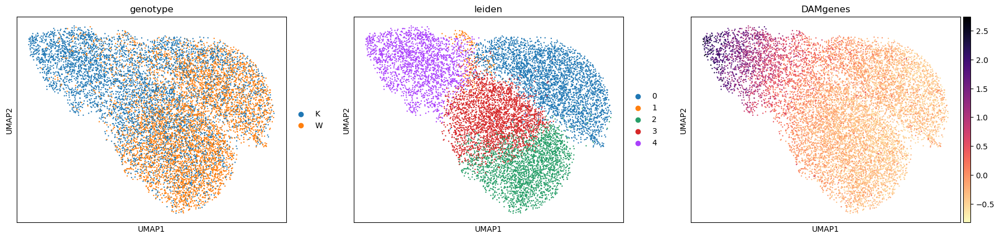

In [124]:
sc.pl.umap(adata, color=["genotype", "leiden", 'DAMgenes'], cmap='magma_r')

As expected - we clearly see the Keren-Shaul's DAM module up in our APP-NLGF mice!

**Note:** You can repeat this with any geneset you like, think about GO ontology genes.

### <span style="color:crimson"> Exercise:</span> Visualize the module score for Keren-Shaul's homeostatic genes

In [125]:
# I already downloaded the top 46
homeo = ['Dtwd1', 'Ppfibp2', 'Ocel1', 'Rasgrp4', 'BC005561', 'Klhl23', 'Hist1h2be', 'Ggta1', 
         'Dgat1', 'Fut4', 'Nars2', 'Dbp', 'Pdlim5', 'Hlf', 'Inpp5e', 'Mex3d', 
         'Diexf', 'A630033H20Rik', 'Rcan2', 'Gimap6', 'Zfp141', 'Klf2', 'Filip1l', 'Szt2', 
         'Il7r', 'Ecscr', 'Lsm11', 'Zfp707', 'Clec4a2', 'Tppp', 'Zfp358', 'Mex3b', 
         'Tut1', '9130011E15Rik', 'A830080D01Rik', 'Zfp398', 'Mtm1', 'Ggt5', 'Slco4a1', 
         'Zfp763', 'Pigz', 'Ccl24', 'Rmnd5b', 'Tgm2', 'Nsun6', 'Cspp1']

### <span style="color:crimson">Extra exercise:</span> If you have time, find genes from your favourite GO category and visualize those genes
([find them here](https://www.informatics.jax.org/function.shtml))

# Differences between experimental conditions

A very common analysis is to see if cells from any given state become more abundant under any condition.

We already suspect there are many more 'DAM' (cluster 4) genes in the APP-NLGF mice. But can we quantify this?

Turns out, this is relatively easy using pandas.

First we make a pivot table counting how many cells are in each cluster, per genoytype.

In [38]:
piv = adata.obs.pivot_table(index='genotype', columns='leiden', values='lane', observed=True, aggfunc=len)
piv

leiden,0,1,2,3,4
genotype,,,,,
K,1286,100,656,1399,1898
W,2008,68,1869,1352,165


You can already see that there is a large amount of cells from cluster 4 (DAMs) in the APP NLGF mouse (K).

But to correct for the different cluster sizes we'll normalize to the total number of cells per cluster (and make it percentages

In [137]:
piv_n = (100 * piv / piv.sum()).round(2)
piv_n

leiden,0,1,2,3,4
genotype,,,,,
K,39.04,59.52,25.98,50.85,92.0
W,60.96,40.48,74.02,49.15,8.0


This is (of course) nicer as a plot:

<Axes: xlabel='leiden'>

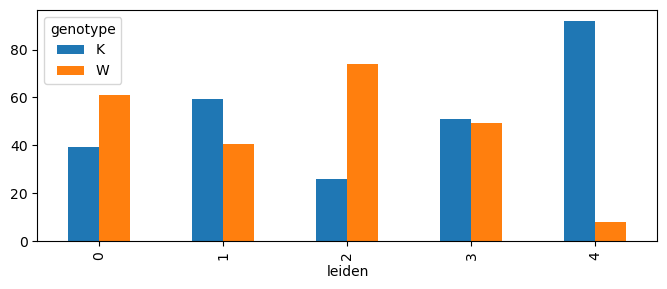

In [144]:
fig = plt.figure(figsize=(8,3))
piv_n.T.plot.bar(ax = fig.gca())

### <span style="color:crimson"> Exercise:</span> Do the same for age.

### <span style="color:crimson"> Exercise:</span> Do the same for genotype times age

Or for age, but then for genotypes seperately. Do you see a progression towards DAM in age, but only the knock-ins?


---

# Continuing the analysis

scRNA-seq data can be interrogated further using a variety of methods:

- Function annotation. You can take your top DE genes to any functional annotation approach. A user friendly example would be [Enrichr](https://maayanlab.cloud/Enrichr/)

- Pseudotime analysis can be used to study the trajectory of cellular development, or of cells transitioning from states (e.g. homeostasis -> activated), using Scanpy's dpt function, or any of a multitude of other tools such as [Dynamo](https://dynamo-release.readthedocs.io/en/latest/) or [Monocle](https://cole-trapnell-lab.github.io/monocle-release/).

- Cell velocity is another powerful tool that looks at the direction and magnitude of gene expression changes to predict future cellular states, this can be done via [scVelo](https://scvelo.readthedocs.io/en/stable/).

- Weighted Gene Co-expression Network Analysis (WGCNA) can also be applied to scRNA-seq data to identify modules of co-expressing genes. These modules can be further analysed to gain insights on underlying trait correlations and functional pathways. On approach from single cell data would be [hdWGCNA](https://smorabit.github.io/hdWGCNA/articles/basic_tutorial.html)


---

# Closing remarks

---

# Appendix 1 - Visualize plots from the paper

In [145]:
# Load the data
import scanpy as sc
adata = sc.read_h5ad('./SalaFrigerio_finished.h5ad')

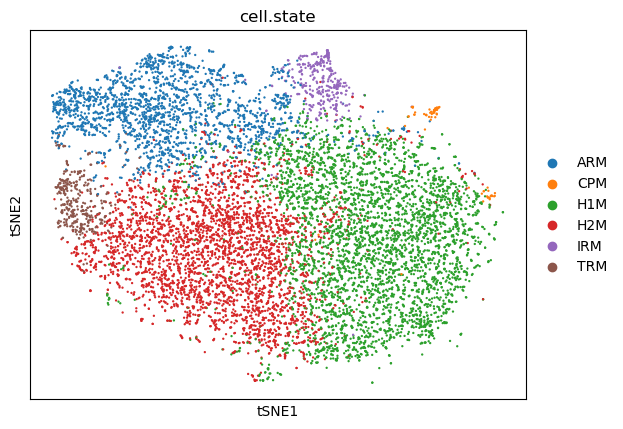

In [146]:
sc.pl.tsne(adata, color='cell.state')

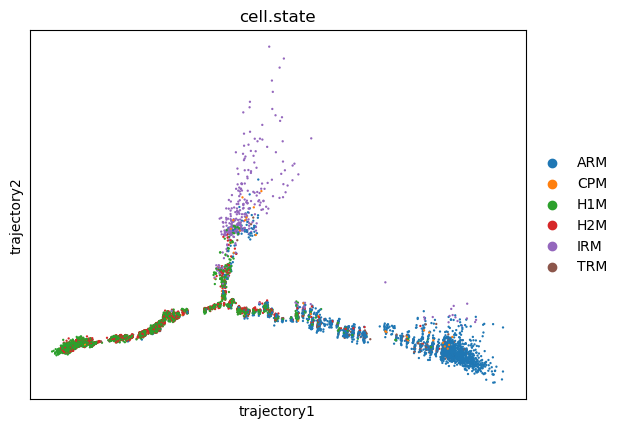

In [147]:
sc.pl.embedding(adata, basis='trajectory', color='cell.state')

---

# Appendix 2 - Background reading

## Technical

* [Jupyter lab documentation](https://jupyterlab.readthedocs.io/en/stable/)
* [Pandas documentation](https://pandas.pydata.org/)
* [Conda](https://docs.conda.io/en/latest/) & [Mamba](https://mamba.readthedocs.io/en/latest/) documentation
* [Scanpy documentation](https://scanpy.readthedocs.io/en/stable/), which is part of the [SCVerse](https://scverse.org/). A collection of tools around single cell (and spatial) analysis (in Python).
* [Seurat](https://satijalab.org/seurat/). The leading single cell framework in `R`
* [Scrublet doublet detection github](https://github.com/swolock/scrublet) and [scrublet paper](https://www.cell.com/cell-systems/fulltext/S2405-4712(18)30474-5?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS2405471218304745%3Fshowall%3Dtrue)

## General resources on single cell data analysis

* [Single cell best practices](https://www.sc-best-practices.org/preamble.html) - a great online book on single cell analysis in python.
* [Single-Cell Transcriptomics: Current Methods and Challenges in Data Acquisition and Analysis](https://www.frontiersin.org/journals/neuroscience/articles/10.3389/fnins.2021.591122/full)
* [Best practices for single-cell analysis across modalities](https://www.nature.com/articles/s41576-023-00586-w)

## Some landmark papers with single cell transcriptomics data

* [A Unique Microglia Type Associated with Restricting Development of Alzheimer’s Disease](https://www.cell.com/fulltext/S0092-8674(17)30578-0)
* [Early Alzheimer's disease pathology in human cortex involves transient cell states](https://pubmed.ncbi.nlm.nih.gov/37774681/)
* [Integrated multimodal cell atlas of Alzheimer’s disease](https://www.biorxiv.org/content/10.1101/2023.05.08.539485v3)

## Where to find public (neuroscience releated) data?

There are many sources to get single cell data from.

- Generate yourself
- Papers
- GEO / SRA - see for example [the GEO page for our paper](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE127893)
- [Seattle AD Brain Cell atlas](https://portal.brain-map.org/explore/seattle-alzheimers-disease)
- [CelLXGene](https://cellxgene.cziscience.com/datasets)
- [Human Cell Atlas](https://data.humancellatlas.org/)
- [Allen Brain Map](https://portal.brain-map.org/)